# Grouping for Synthesis AI face dataset

At first, we install some dependencies.

Installing `face_api_dataset` from the github it it's not already installed.

In [1]:
%%bash

(python -c "import face_api_dataset")
if [ $? -eq 0 ]
then
    echo "face_api_dataset is already installed"
else
    echo "installing face_api_dataset from github"
    pip install git+https://github.com/Synthesis-AI-Dev/face_api_dataset.git
fi

face_api_dataset is already installed


Installing `git lfs` from the github it it's not already installed.

In [2]:
%%bash

(git lfs install > /dev/null)
if [ $? -eq 0 ]
then
    echo "git lfs is already installed"
else
    echo "installing git lfs"
    case "$(uname -s)" in

       Darwin)
         brew install git-lfs
         ;;

       Linux)
         curl -s https://packagecloud.io/install/repositories/github/git-lfs/script.deb.sh | sudo bash
         apt-get install git-lfs
         ;;

       *)
         echo "This cell can't install git lfs your OS. Please take care of it yourself."
         ;;
    esac
fi

git lfs is already installed


Pulling the test dataset for the example

In [3]:
%%bash

if [ -d "../test_dataset" ]
then
    echo "test_dataset is already present"
else
    echo "downloading test_dataset"
    git clone https://github.com/Synthesis-AI-Dev/face_api_dataset
    mv face_api_dataset/test_dataset ..
    rm -rf face_api_dataset
fi

test_dataset is already present


Finally we add some imports for the visualisation.

In [4]:
%matplotlib inline

In [5]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

We use `FaceApiDataset` class to access synthesis datasets.

In [6]:
from face_api_dataset import FaceApiDataset, Modality, Grouping

We have different options for groupping the dataset items. `grouping=Grouping.None` was set be default in previous examples so we will showcase more advanced cases.

If `grouping=Grouping.None` is set, then each image is treated independently.
The size of the dataset is **#scenes** * **#cameras** * **#frames**  (assuming the same number of the cameras/frames per scene). Each items is a plain `Item` dict.

In [7]:
data_root = "../test_dataset"
dataset = FaceApiDataset(data_root, grouping=Grouping.NONE)

len(dataset)

86

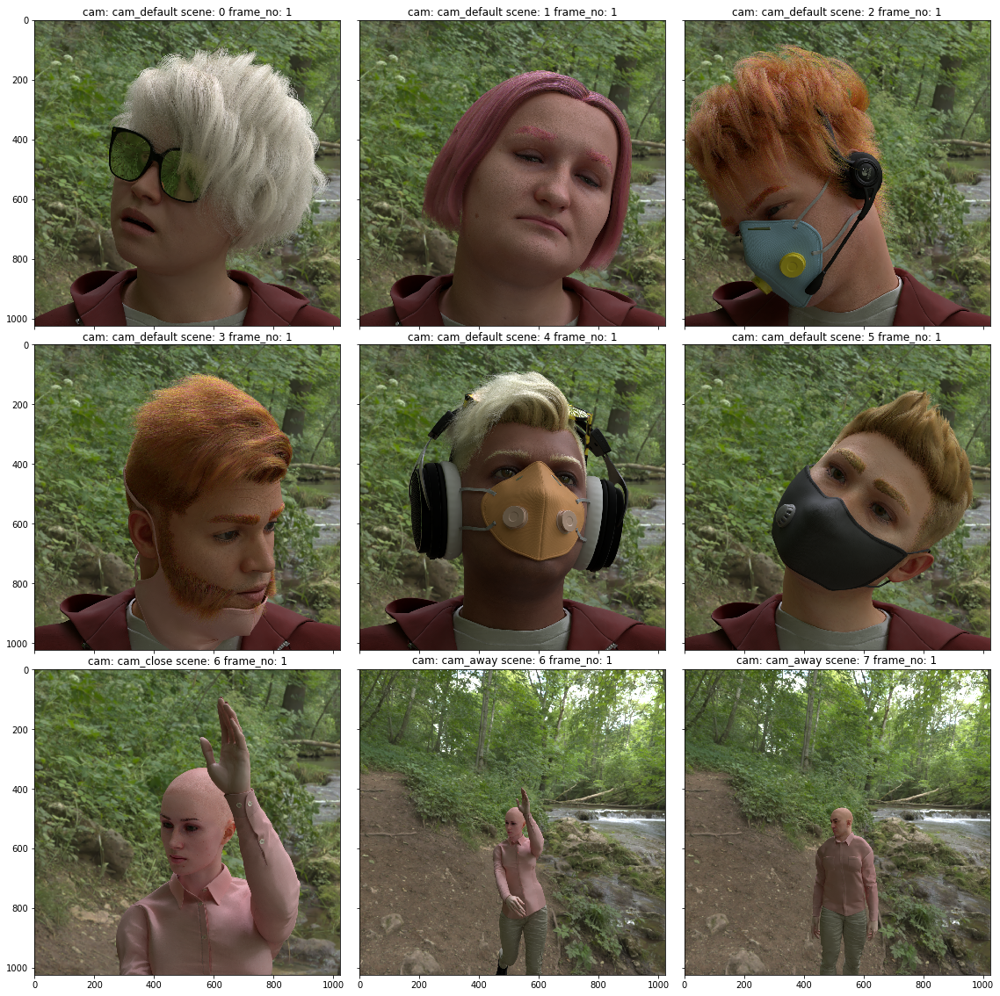

In [8]:
fig = plt.figure(figsize=(20, 20))
grid = ImageGrid(fig, 111,
                 nrows_ncols=(3, 3),
                 axes_pad=0.3,
                 )

for ax, frame in zip(grid, dataset):
    ax.imshow(frame[Modality.RGB])
    title = f"cam: {frame[Modality.CAMERA_NAME]} scene: {frame[Modality.RENDER_ID]} frame_no: {frame[Modality.FRAME_NUM]}"
    ax.set_title(title)
plt.show()    

If `grouping=Grouping.CAMERA` is set, then all frames from the same camera are grouped and can be indexed by `frame_id`.

The size of the dataset is **#cameras** , each element `List[Item]` is a list of frames from all scenes with the same camera.

In [9]:
data_root = "../test_dataset"
dataset = FaceApiDataset(data_root, grouping=Grouping.CAMERA)

len(dataset)

3

In [10]:
item = dataset[1]
len(item)

40

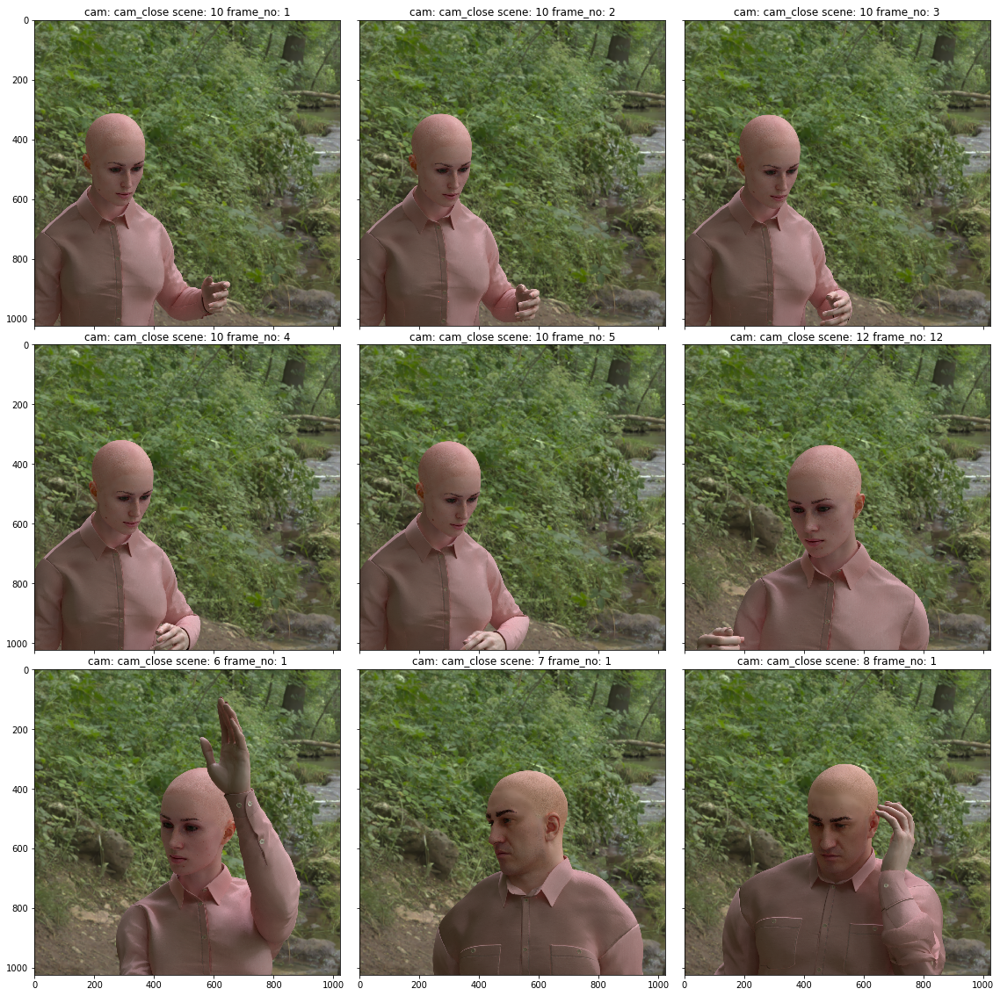

In [11]:
fig = plt.figure(figsize=(20, 20))
grid = ImageGrid(fig, 111,
                 nrows_ncols=(3, 3),
                 axes_pad=0.3,
                 )

for ax, frame in zip(grid, item[:5] + item[-5:]):
    ax.imshow(frame[Modality.RGB])
    title = f"cam: {frame[Modality.CAMERA_NAME]} scene: {frame[Modality.RENDER_ID]} frame_no: {frame[Modality.FRAME_NUM]}"
    ax.set_title(title)
plt.show()    

If `grouping=Grouping.CAMERA_SCENE` is set, then all frames are groped first by camera and then by scene.
List of frames for a particular scene is indexed by `scene_id`.

The size of the dataset is **#cameras** , each element is a `Dict[scene_id, List[Item]]`, with **#scenes** items, where `[List[Item]` is a list of consecutive frames for given camera and scene.

In [12]:
data_root = "../test_dataset"
dataset = FaceApiDataset(data_root, grouping=Grouping.CAMERA_SCENE)

len(dataset)

3

ITEM: 1


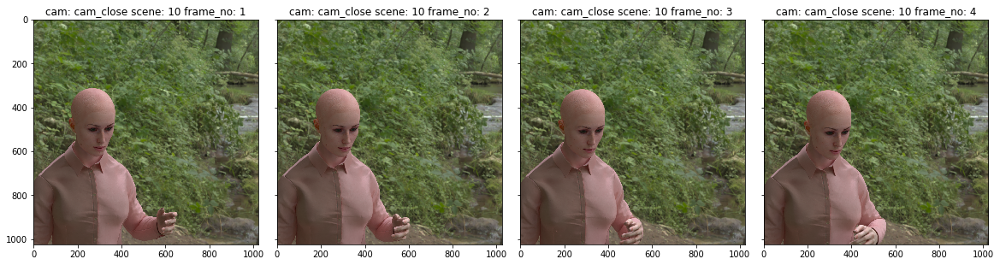

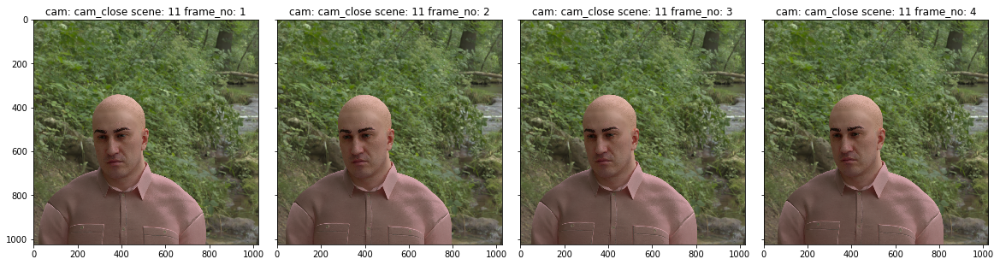

ITEM: 2


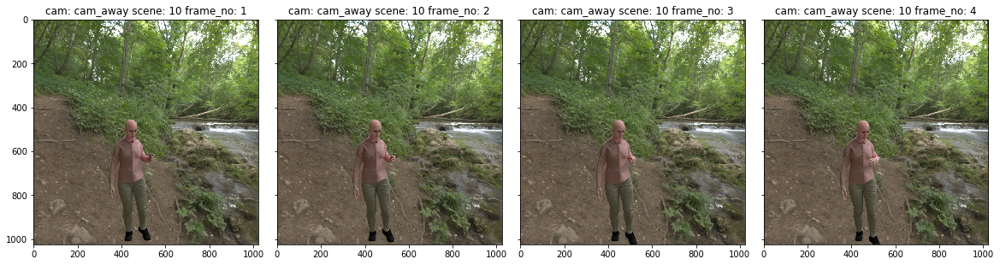

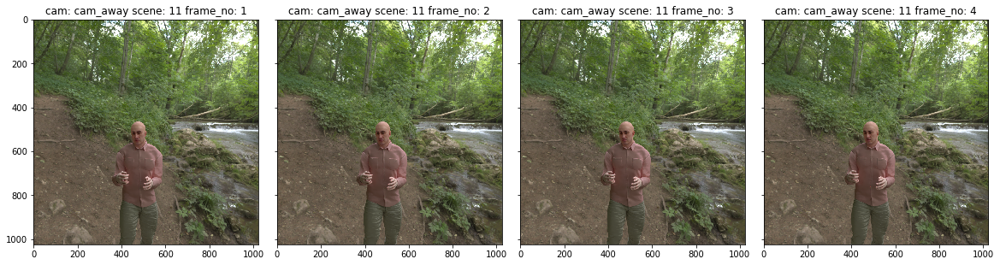

In [13]:
for i, data_item in enumerate((dataset[1], dataset[2]), 1):
    print("ITEM:", i)
    for scene in ["10", "11"]:
        fig = plt.figure(figsize=(20, 20))
        grid = ImageGrid(fig, 111,
                         nrows_ncols=(1, 4),
                         axes_pad=0.3,
                         )

        for ax, frame in zip(grid, data_item[scene]):
            ax.imshow(frame[Modality.RGB])
            title = f"cam: {frame[Modality.CAMERA_NAME]} scene: {frame[Modality.RENDER_ID]} frame_no: {frame[Modality.FRAME_NUM]}"
            ax.set_title(title)
        plt.show()    

If `grouping=Grouping.SCENE` is set, then all frames from the same scene are grouped and can be indexed by `camera_name`.

The size of the dataset is **#scenes** , each element `List[Item]` is is a list of frames from all cameras from the same scene.

In [14]:
data_root = "../test_dataset"
dataset = FaceApiDataset(data_root, grouping=Grouping.SCENE)

len(dataset)

13

In [15]:
item = dataset[1]

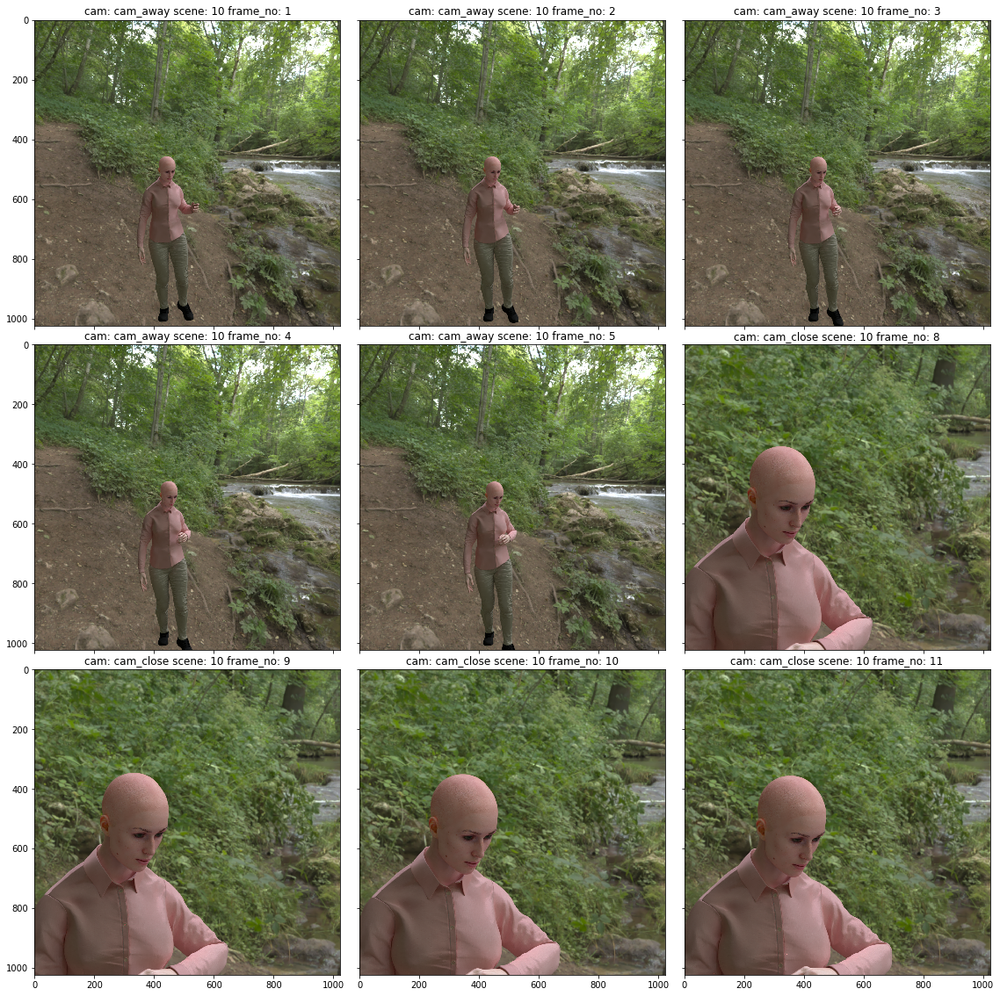

In [16]:
fig = plt.figure(figsize=(20, 20))
grid = ImageGrid(fig, 111,
                 nrows_ncols=(3, 3),
                 axes_pad=0.3,
                 )

for ax, frame in zip(grid, item[:5] + item[-5:]):
    ax.imshow(frame[Modality.RGB])
    title = f"cam: {frame[Modality.CAMERA_NAME]} scene: {frame[Modality.RENDER_ID]} frame_no: {frame[Modality.FRAME_NUM]}"
    ax.set_title(title)
plt.show()    

If `grouping=Grouping.SCENE_CAMERA` is set, then all frames are groped first by scene and then by camera.
List of frames for a particular scene is indexed by `camera_name`.

The size of the dataset is **#scenes** , each element is a `Dict[scene_id, List[Item]]` with **#cameras** items, where `[List[Item]` is a list of consecutive frames for given scene and camera.

In [17]:
data_root = "../test_dataset"
dataset = FaceApiDataset(data_root, grouping=Grouping.SCENE_CAMERA)

len(dataset)

13

In [18]:
dataset[2].keys()

dict_keys(['cam_away', 'cam_close'])

ITEM: 2


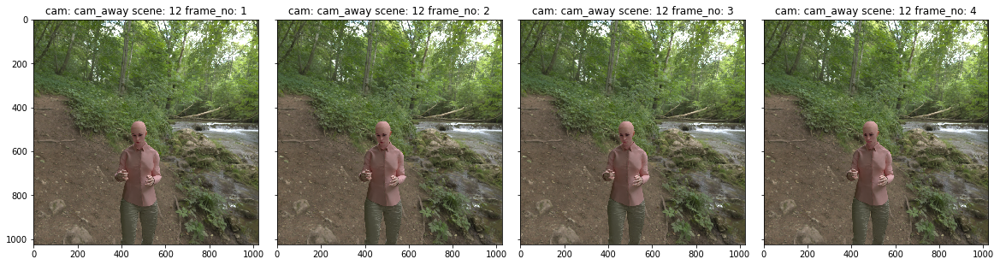

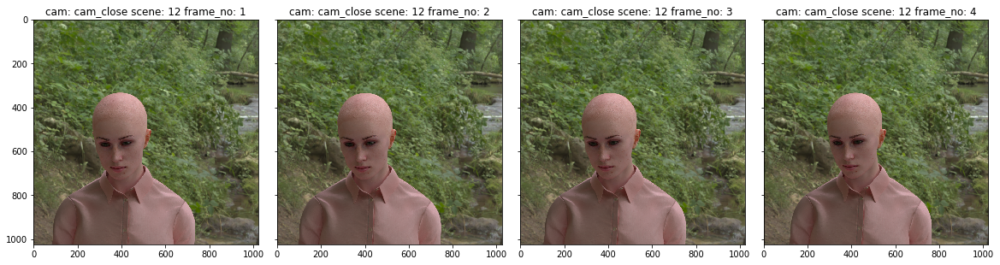

ITEM: 3


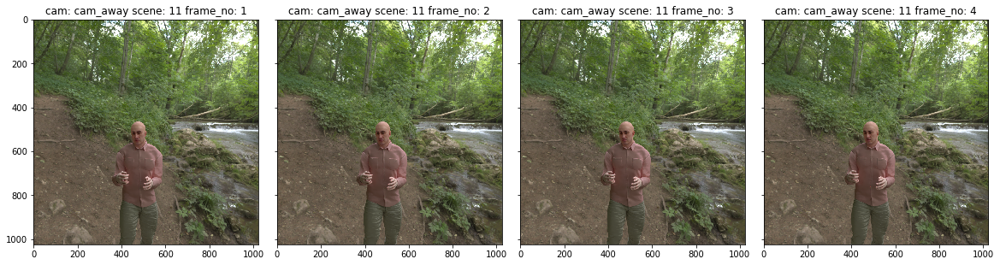

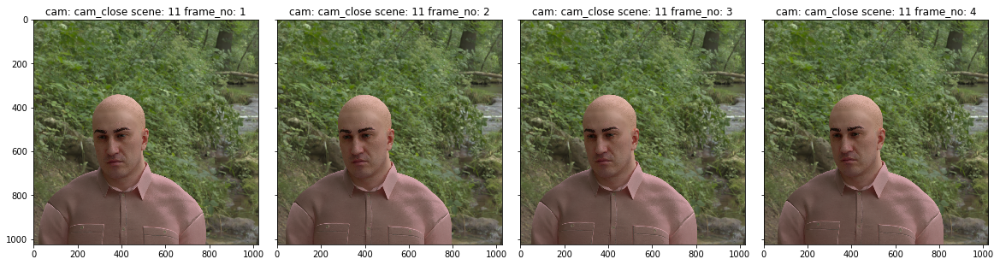

In [19]:
for i, data_item in enumerate((dataset[2], dataset[3]), 2):
    print("ITEM:", i)
    for cam in ["cam_away", "cam_close"]:
        fig = plt.figure(figsize=(20, 20))
        grid = ImageGrid(fig, 111,
                         nrows_ncols=(1, 4),
                         axes_pad=0.3,
                         )

        for ax, frame in zip(grid, data_item[cam]):
            ax.imshow(frame[Modality.RGB])
            title = f"cam: {frame[Modality.CAMERA_NAME]} scene: {frame[Modality.RENDER_ID]} frame_no: {frame[Modality.FRAME_NUM]}"
            ax.set_title(title)
        plt.show()    